# Bedmap3 Grids
**Description:**  Gridded data in EPSG 3031 projection. Topographic layers, uncertainties, and masks.

**Dataset:** 

Pritchard, H., Fretwell, P., Fremand, A., Bodart, J., Kirkham, J., Aitken, A., Bamber, J., Bell, R., Bianchi, C., Bingham, R., Blankenship, D., Casassa, G., Catania, G., Christianson, K., Conway, H., Corr, H., Cui, X., Damaske, D., Damn, V., ... Zirizzotti, A. (2024). BEDMAP3 - Ice thickness, bed and surface elevation for Antarctica - gridding products (Version 1.0) [Data set]. NERC EDS UK Polar Data Centre. https://doi.org/10.5285/2d0e4791-8e20-46a3-80e4-f5f6716025d2

**Associated paper:** 

Pritchard, H.D., Fretwell, P.T., Fremand, A.C. et al. Bedmap3 updated ice bed, surface and thickness gridded datasets for Antarctica. Sci Data 12, 414 (2025). https://doi.org/10.1038/s41597-025-04672-y

In [1]:
%%capture
%load_ext autoreload
%autoreload 2


from polartoolkit import fetch, maps, regions, utils

In [2]:
layer_names = [
    # topographies
    "surface",
    "icebase",
    "bed",
    # thicknesses
    "ice_thickness",
    "water_thickness",
    # uncertainties
    "bed_uncertainty",
    "ice_thickness_uncertainty",
    # others
    "mask",
]

grids = []
for name in layer_names:
    data = fetch.bedmap3(
        layer=name,
        # available options
        # reference ("eigen-gl04c" or "ellipsoid")
        # region,
        # spacing,
        # registration ("g" for gridline or "p" for pixel),
        # fill_nans (True or False),
    )
    grids.append(data)
    print(f"Info for {name}")
    _ = utils.get_grid_info(data, print_info=True)
    print("##########")

Info for surface
grid spacing: 500.0 m
grid region: (-3333000.0, 3333000.0, -3333000.0, 3333000.0)
grid zmin: 1.0
grid zmax: 4711.34765625
grid registration: g
##########
Info for icebase
grid spacing: 500.0 m
grid region: (-3333000.0, 3333000.0, -3333000.0, 3333000.0)
grid zmin: -2973.46875
grid zmax: 4634.91015625
grid registration: g
##########
Info for bed
grid spacing: 500.0 m
grid region: (-3333000.0, 3333000.0, -3333000.0, 3333000.0)
grid zmin: -7409.0
grid zmax: 4634.91015625
grid registration: g
##########
Info for ice_thickness
grid spacing: 500.0 m
grid region: (-3333000.0, 3333000.0, -3333000.0, 3333000.0)
grid zmin: 0.0
grid zmax: 4751.06640625
grid registration: g
##########
Info for water_thickness
grid spacing: 500.0 m
grid region: (-3333000.0, 3333000.0, -3333000.0, 3333000.0)
grid zmin: 0.0
grid zmax: 2807.65893555
grid registration: g
##########
Info for bed_uncertainty
grid spacing: 500.0 m
grid region: (-3333000.0, 3333000.0, -3333000.0, 3333000.0)
grid zmin: 7.0
g

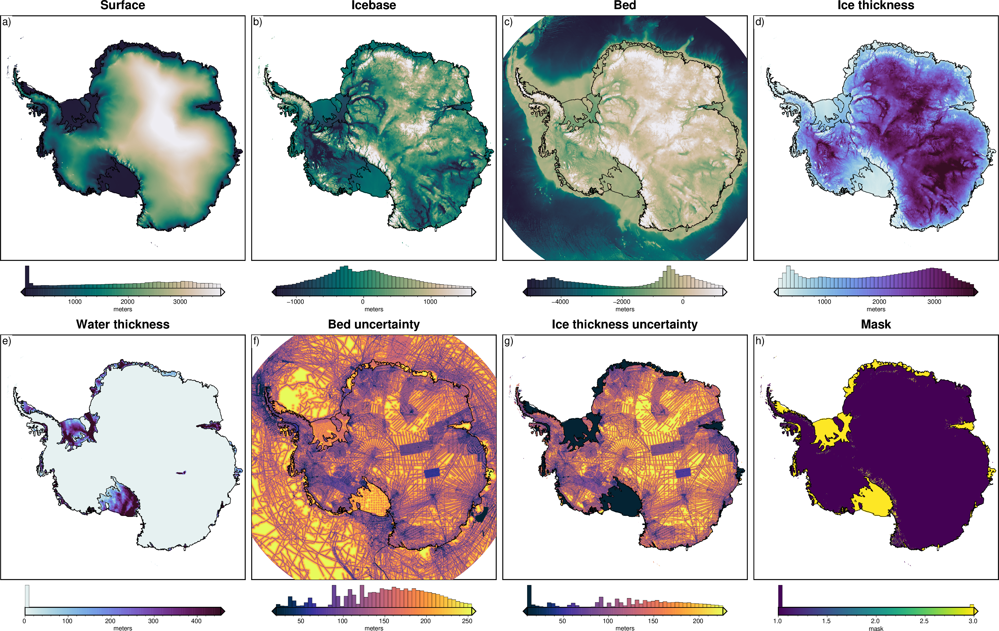

In [3]:
titles = [
    "Surface",
    "Icebase",
    "Bed",
    "Ice thickness",
    "Water thickness",
    "Bed uncertainty",
    "Ice thickness uncertainty",
    "Mask",
]
cmaps = [
    "rain",
    "rain",
    "rain",
    "dense",
    "dense",
    "thermal",
    "thermal",
    "viridis",
]
cbar_labels = ["meters"] * 7 + ["mask"]

reverse_cpts = [True] * 3 + [False] * 5

fig = maps.subplots(
    grids,
    titles=titles,
    cmaps=cmaps,
    reverse_cpts=reverse_cpts,
    cbar_labels=cbar_labels,
    region=regions.antarctica,
    hist=True,
    coast=True,
    robust=True,
    hemisphere="south",
)
fig.show(dpi=200)